# Loading the Data

In [ ]:
import kagglehub
import pandas as pd
import numpy as np
import os

pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [ ]:
# Download latest version
path = kagglehub.dataset_download("nicolaswattiez/skillbuilder-data-2009-2010")

print("Path to dataset files:", path)

100%|██████████| 629M/629M [00:10<00:00, 60.0MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/nicolaswattiez/skillbuilder-data-2009-2010/versions/4


In [ ]:
dataset_file = os.path.join(path, "2012-2013-data-with-predictions-4-final.csv")

# Load the CSV into a pandas DataFrame
df = pd.read_csv(dataset_file)

# Quick Statistics

In [ ]:
# View a snippet of the entire dataset
df.head()

,problem_log_id,skill,problem_id,user_id,assignment_id,assistment_id,start_time,end_time,problem_type,original,correct,bottom_hint,hint_count,actions,attempt_count,ms_first_response,tutor_mode,sequence_id,student_class_id,position,type,base_sequence_id,skill_id,teacher_id,school_id,overlap_time,template_id,answer_id,answer_text,first_action,problemlogid,Average_confidence(FRUSTRATED),Average_confidence(CONFUSED),Average_confidence(CONCENTRATING),Average_confidence(BORED)
0,137792159,NaN,557460,61394,565736,341511,2012-09-28 15:11:27,2012-09-28 15:11:36.856,choose_1,1,1.0,0.0,0,"--- \n- - start\n - 1348859487561\n - ""959522""\n- - answer\n - 9852\n - true\n - she\n - \n- - end\n",1,9852,tutor,55482,23643,4,LinearSection,55482,NaN,53472,5048.0,9852,341511,NaN,she,0,137792159,0.361323,0.0,0.336529,0.000000
1,138083797,Rounding,365981,61394,573819,204043,2012-10-09 11:01:52,2012-10-09 11:02:13.182,algebra,1,1.0,0.0,0,"--- \n- - start\n - 1349794912269\n - ""624595""\n- - answer\n - 21175\n - true\n - ""74.29""\n - \n- - end\n",1,21175,tutor,34221,22967,5,LinearSection,34221,54.0,47424,5048.0,21175,204043,NaN,74.29,0,138083797,0.361323,0.0,0.766925,0.000000
2,142332619,Multiplication and Division Integers,426415,61394,734130,247525,2013-03-07 10:53:20,2013-03-07 10:53:28.661,algebra,1,0.0,0.0,0,"--- \n- - start\n - 1362671600405\n - ""741079""\n- - answer\n - 8645\n - false\n - ""00""\n - \n- - end\n",1,8645,tutor,39601,22967,58,LinearSection,39601,279.0,47424,5048.0,8645,247525,NaN,00,0,142332619,0.361323,0.0,0.766925,0.442968
3,145939397,Proportion,86686,61394,821352,48081,2013-08-20 19:54:56,2013-08-20 19:55:21.753,algebra,1,1.0,0.0,0,"--- \n- - start\n - 1377042896503\n - ""73630""\n- - answer\n - 25728\n - true\n - ""3.8""\n - \n- - end\n",1,25728,tutor,6912,26303,21,MasterySection,6912,79.0,47424,5048.0,25728,46362,NaN,3.8,0,145939397,0.775000,0.0,0.766925,0.912281
4,137111284,NaN,399669,76592,557216,227869,2012-09-10 17:20:10,2012-09-10 17:24:56.579,choose_1,1,1.0,0.0,0,"--- \n- - start\n - 1347312010563\n - ""694797""\n- - answer\n - 286578\n - true\n - C (wr - 1)(wr + 1)\n - \n- - end\n",1,286578,tutor,37143,21696,3,LinearSection,37143,NaN,152676,7561.0,286578,227869,NaN,C (wr - 1)(wr + 1),0,137111284,0.361323,0.0,0.766925,0.000000


The next step is to determine the feasibility of organizing students into trajectories and determine how many rows per student can be used to approximate a more accurate starting state.

In [ ]:
# get total number of students = # of trajectories
print("Number of students: ", df['user_id'].nunique())

# get summary statistics of problems per student
# this helps us determine whether we can use and throw out the first few entries to get a better starting state for students
problems_per_student = df.groupby('user_id')['problem_id'].count()
median_problems = problems_per_student.median()
average_problems = problems_per_student.mean()

print("Average number of problems per student: ", average_problems)
print("Median number of problems per student: ", median_problems)

Number of students:  46674
Average number of problems per student:  131.19231263658568
Median number of problems per student:  49.0


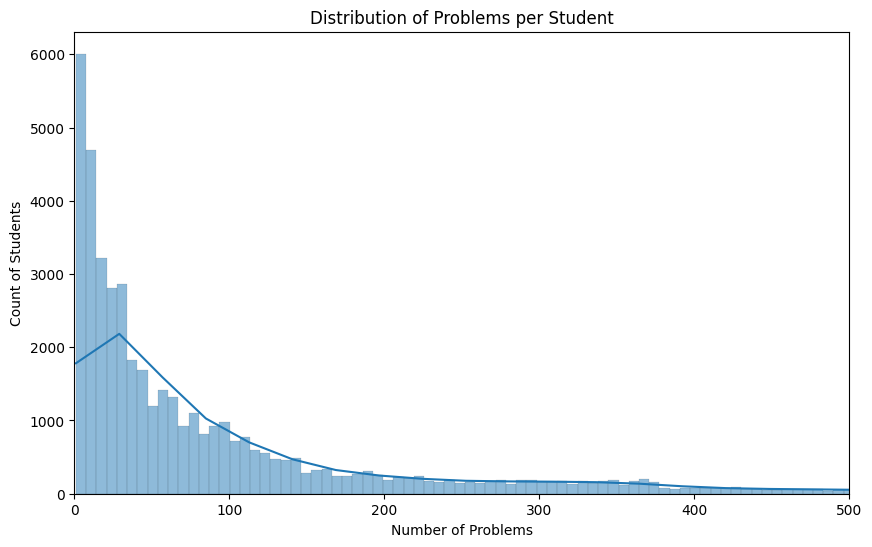

In [ ]:
# plot the distribution of unique problems per student
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.histplot(problems_per_student, kde=True)
plt.title('Distribution of Problems per Student')
plt.xlabel('Number of Problems')
plt.ylabel('Count of Students')
plt.xlim(0, 500)
plt.show()

From this, we can limit our dataset to these students and use about 10 of their problems to estimate a starting accuracy state during the preprocessing step.

Now, we observe the problem skill distribution per student to ensure that our evaluation policy is feasible (i.e. students are tested on a variety of skills, making it possible for us to assign them problems in a different skill category rather than a problem with a specific ID).

In [ ]:
unique_skills_per_student_assessment = df.groupby(['user_id'])['skill'].nunique()

count_above_10_skills = ((unique_skills_per_student_assessment >= 10) & (problems_per_student >= 20)).sum()
print("Number of students with unique skills above or equal to 10 and above or equal to 20 problems tested:", count_above_10_skills)

Number of students with unique skills above or equal to 10 and above or equal to 20 problems tested: 12194


# Preprocessing

In [ ]:
## Organize rows into trajectories ordered by students and start time

df['start_time'] = pd.to_datetime(df['start_time'], errors='coerce')
df = df.dropna(subset=['start_time']) # drop rows where start_time conversion fails

# Sort by user and start_time
df = df.sort_values(by=['user_id', 'start_time'])

df.head()

,problem_log_id,skill,problem_id,user_id,assignment_id,assistment_id,start_time,end_time,problem_type,original,correct,bottom_hint,hint_count,actions,attempt_count,ms_first_response,tutor_mode,sequence_id,student_class_id,position,type,base_sequence_id,skill_id,teacher_id,school_id,overlap_time,template_id,answer_id,answer_text,first_action,problemlogid,Average_confidence(FRUSTRATED),Average_confidence(CONFUSED),Average_confidence(CONCENTRATING),Average_confidence(BORED)
968401,145035021,Equation Solving Two or Fewer Steps,694349,21421,807354,439703,2013-05-22 14:44:20,2013-05-22 14:44:43.483,algebra,1,0.0,1.0,2,"--- \n- - start\n - 1369248260345\n - ""1746513""\n- - hint\n - 17482\n- - hint\n - 19560\n- - answer\n - 23462\n - true\n - ""4""\n - \n- - end\n",1,17482,tutor,195693,26029,1,LinearSection,195693,311.0,11436,4986.0,17482,439703,NaN,NaN,1,145035021,0.361323,0.0,0.766925,0.218182
47925,145035378,NaN,694384,21421,807360,439736,2013-05-22 14:57:15,2013-05-22 14:58:04.41,algebra,1,0.0,1.0,2,"--- \n- - start\n - 1369249035379\n - ""1746551""\n- - hint\n - 25738\n- - hint\n - 42392\n- - answer\n - 49394\n - true\n - ""6.1""\n - \n- - end\n",1,25738,tutor,195697,26029,2,LinearSection,195697,NaN,11436,4986.0,25738,439736,NaN,NaN,1,145035378,0.361323,0.0,0.253022,0.762689
5084076,145035411,NaN,694385,21421,807360,439737,2013-05-22 14:58:06,2013-05-22 14:58:29.02,algebra,1,1.0,0.0,0,"--- \n- - start\n - 1369249086133\n - ""1746552""\n- - answer\n - 23005\n - true\n - ""9.6""\n - \n- - end\n",1,23005,tutor,195697,26029,2,LinearSection,195697,NaN,11436,4986.0,23005,439737,NaN,9.6,0,145035411,0.775000,0.0,0.766925,0.000000
4137747,145035419,NaN,694386,21421,807360,439738,2013-05-22 14:58:30,2013-05-22 15:00:09.777,algebra,1,0.0,1.0,1,"--- \n- - start\n - 1369249110215\n - ""1746553""\n- - answer\n - 16512\n - false\n - ""16.5""\n - \n- - answer\n - 22931\n - false\n - ""16.5""\n - \n- - hint\n - 23958\n- - answer\n - 99761\n - true\n - ""13.9""\n - \n- - end\n",3,16512,tutor,195697,26029,2,LinearSection,195697,NaN,11436,4986.0,16512,439738,NaN,16.5,0,145035419,0.361323,0.0,0.350182,0.912281
3276993,145281682,Point Plotting,114117,21421,816118,59886,2013-06-05 13:00:06,2013-06-05 13:00:13.897,choose_1,1,1.0,0.0,0,"--- \n- - start\n - 1370451606060\n - ""115357""\n- - answer\n - 7890\n - true\n - Quadrant IV\n - \n- - end\n",1,7890,tutor,7922,26029,5,MasterySection,7922,103.0,11436,4986.0,7890,58277,NaN,Quadrant IV,0,145281682,0.361323,0.0,0.336529,0.442968


In [ ]:
## Account for missing or unclear data

# Drop rows that have more than half of their data missing
df = df.dropna(thresh=int(df.shape[1] * 0.5))

# Drop rows with missing skills
df = df.dropna(subset=['skill', 'skill_id'])

In [ ]:
# Aggregate the average_confidence categories into an average column
confidence_categories = ['Average_confidence(CONFUSED)', 'Average_confidence(FRUSTRATED)', 'Average_confidence(CONCENTRATING)', 'Average_confidence(BORED)']
df['average_confidence'] = df[confidence_categories].mean(axis=1)

In [ ]:
# Filter for users with >= 20 unique problems and >= 10 unique skills tested
unique_skills_per_student_assessment = df.groupby(['user_id'])['skill'].nunique()
problems_per_student = df.groupby('user_id')['problem_id'].count()

qualified_users = (unique_skills_per_student_assessment.index[
    (unique_skills_per_student_assessment >= 10) &
    (problems_per_student >= 20)
])

# Only include necessary features in the final df
final_df = df[['user_id', 'problem_id', 'skill', 'skill_id', 'start_time', 'average_confidence', 'actions']]
final_df = final_df[final_df['user_id'].isin(qualified_users)]

print("Number of unique students fulfilling the conditions: ", final_df['user_id'].nunique())

Number of unique students fulfilling the conditions:  11907


We now want to add an additional condition beyond number of points and skills tested: overlap in skills - we want a dataset of students that are all tested on the same skills for our results to make sense! To do this we chose to represent the top 10 skills.

In [ ]:
# Get the top 10 represented skills
top_10_skills_unique_users = (
    final_df.groupby(['skill_id', 'skill'])['user_id']
    .nunique()
    .reset_index(name='user_count')
    .sort_values('user_count', ascending=False)
    .head(10)
)

top_10_skills = top_10_skills_unique_users['skill_id'].tolist()
top_10_skills_names = top_10_skills_unique_users['skill'].tolist()

# Filter out all rows that don't discuss those skills
skills_df = final_df[final_df['skill_id'].isin(top_10_skills)]

# Get number of unique skills per user left in the group
user_skill_counts = skills_df.groupby('user_id')['skill_id'].nunique()

# Filter for the ones that cover all 10 skills
users_with_all_skills = user_skill_counts[user_skill_counts == 10].index
skills_df = skills_df[skills_df['user_id'].isin(users_with_all_skills)]

# Get the users with at least 20 data points remaining
problems_per_student = skills_df.groupby('user_id')['problem_id'].count()
valid_users = problems_per_student[problems_per_student >= 20].index

final_df = skills_df[skills_df['user_id'].isin(valid_users)]

print(final_df['user_id'].nunique())

739


We create a few additional features:

- `correctly_answered` (bool): Whether the student's last attempt was correct, based on the `actions` feature. The original dataset provides a `correct` feature, which is true/false depending on if the student answered correctly the *first* time. However, we are more interested in if a student was able to answer the question correctly by the *end*, which is not provided.
- `num_correct` per skill (float): `num_correct` but for specific problem types based on the `skill` feature (i.e. `num_correct_rounding`, etc.)
- `num_seen` per skill (float): `num_seen` but for specific problem types based on the `skill` feature (i.e. `num_seen_rounding`, etc.)

These features, along with `average_confidence`, are meant to measure a student's **competency level**, which is related to the reward we use for our evaluation policy (how much a student improves).

In [ ]:
# Derive correctly_answered feature
def check_correct(action):
    if pd.isna(action):
        return False
    return 'answer' in action and 'true' in action

final_df['correctly_answered'] = final_df['actions'].apply(check_correct)

final_df.head()

,user_id,problem_id,skill,skill_id,start_time,average_confidence,actions,correctly_answered
1735152,96359,89710,Addition and Subtraction Integers,277.0,2012-09-17 12:53:03,0.174463,"--- \n- - start\n - 1347900783234\n - ""77625""\n- - answer\n - 11483\n - true\n - ""-1""\n - \n- - end\n",True
1699252,96359,89716,Addition and Subtraction Integers,277.0,2012-09-17 12:53:15,0.282062,"--- \n- - start\n - 1347900795915\n - ""77641""\n- - answer\n - 7549\n - true\n - ""-12""\n - \n- - end\n",True
1579533,96359,89734,Addition and Subtraction Integers,277.0,2012-09-17 12:53:23,0.282062,"--- \n- - start\n - 1347900803922\n - ""77659""\n- - answer\n - 8788\n - true\n - ""-7""\n - \n- - end\n",True
4353181,96359,53942,Addition and Subtraction Integers,277.0,2012-09-17 12:53:41,0.174463,"--- \n- - start\n - 1347900821484\n - ""46690""\n- - answer\n - 8674\n - true\n - ""2""\n - \n- - end\n",True
2392299,96359,53903,Addition and Subtraction Integers,277.0,2012-09-17 12:53:50,0.282062,"--- \n- - start\n - 1347900830560\n - ""46650""\n- - answer\n - 13066\n - true\n - ""-27""\n - \n- - end\n",True


In [ ]:
# Derive accuracy
def adjust_trajectory(g):
    # subtract by adjust_on_first for the first sighting of that problem type
    # 0.5 if correct, 0 if incorrect
    adjust_on_first = 0.5 if g['correctly_answered'].iloc[0] else 0
    for skill in top_10_skills_names:
      g[f"num_correct_{skill}"] = np.maximum(0, ((g['correctly_answered'].iloc[0] * (g['skill'] == skill)).cumsum() - adjust_on_first))
      g[f"num_seen_{skill}"] = (g['skill'] == skill).cumsum()

    return g

final_df = final_df.groupby('user_id', group_keys=False).apply(adjust_trajectory).reset_index(drop=True)

<ipython-input-14-cf8ce51db8a9>:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  final_df = final_df.groupby('user_id', group_keys=False).apply(adjust_trajectory).reset_index(drop=True)


In [ ]:
final_df.head()

,user_id,problem_id,skill,skill_id,start_time,average_confidence,actions,correctly_answered,num_correct_Addition and Subtraction Fractions,num_seen_Addition and Subtraction Fractions,num_correct_Exponents,num_seen_Exponents,num_correct_Addition and Subtraction Integers,num_seen_Addition and Subtraction Integers,num_correct_Conversion of Fraction Decimals Percents,num_seen_Conversion of Fraction Decimals Percents,num_correct_Equation Solving Two or Fewer Steps,num_seen_Equation Solving Two or Fewer Steps,num_correct_Order of Operations All,num_seen_Order of Operations All,num_correct_Division Fractions,num_seen_Division Fractions,num_correct_Multiplication and Division Positive Decimals,num_seen_Multiplication and Division Positive Decimals,num_correct_Multiplication Fractions,num_seen_Multiplication Fractions,"num_correct_Order of Operations +,-,/,* () positive reals","num_seen_Order of Operations +,-,/,* () positive reals"
0,96359,89710,Addition and Subtraction Integers,277.0,2012-09-17 12:53:03,0.174463,"--- \n- - start\n - 1347900783234\n - ""77625""\n- - answer\n - 11483\n - true\n - ""-1""\n - \n- - end\n",True,0.0,0,0.0,0,0.5,1,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0
1,96359,89716,Addition and Subtraction Integers,277.0,2012-09-17 12:53:15,0.282062,"--- \n- - start\n - 1347900795915\n - ""77641""\n- - answer\n - 7549\n - true\n - ""-12""\n - \n- - end\n",True,0.0,0,0.0,0,1.5,2,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0
2,96359,89734,Addition and Subtraction Integers,277.0,2012-09-17 12:53:23,0.282062,"--- \n- - start\n - 1347900803922\n - ""77659""\n- - answer\n - 8788\n - true\n - ""-7""\n - \n- - end\n",True,0.0,0,0.0,0,2.5,3,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0
3,96359,53942,Addition and Subtraction Integers,277.0,2012-09-17 12:53:41,0.174463,"--- \n- - start\n - 1347900821484\n - ""46690""\n- - answer\n - 8674\n - true\n - ""2""\n - \n- - end\n",True,0.0,0,0.0,0,3.5,4,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0
4,96359,53903,Addition and Subtraction Integers,277.0,2012-09-17 12:53:50,0.282062,"--- \n- - start\n - 1347900830560\n - ""46650""\n- - answer\n - 13066\n - true\n - ""-27""\n - \n- - end\n",True,0.0,0,0.0,0,4.5,5,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0


In [ ]:
print(len(final_df))

161355


And we are now ready for the next steps: deriving an evaluation policy and running our previous experimentation on this dataset!

In [ ]:
top_10_skills_names

['Addition and Subtraction Fractions',
 'Exponents',
 'Addition and Subtraction Integers',
 'Conversion of Fraction Decimals Percents',
 'Equation Solving Two or Fewer Steps',
 'Order of Operations All',
 'Division Fractions',
 'Multiplication and Division Positive Decimals',
 'Multiplication Fractions',
 'Order of Operations +,-,/,* () positive reals']

In [ ]:
top_10_skills

[280.0, 86.0, 277.0, 47.0, 311.0, 310.0, 61.0, 276.0, 67.0, 309.0]

In [ ]:
state_columns = []
for name in top_10_skills_names:
    state_columns.append(f"num_seen_{name}")
    state_columns.append(f"num_correct_{name}")

In [ ]:
result = (
    final_df.groupby('user_id')
    .apply(lambda group: [(row['skill_id'], tuple(row[state_columns])) for _, row in group.iterrows()])
    .tolist()
)

print(result[1])
print(len(result))

[(277.0, (0, 0.0, 0, 0.0, 1, 0.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 2, 1.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 3, 2.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 4, 3.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 5, 4.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 6, 5.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 7, 6.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 8, 7.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 9, 8.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 10, 9.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 11, 10.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.

<ipython-input-20-403e678dfa88>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda group: [(row['skill_id'], tuple(row[state_columns])) for _, row in group.iterrows()])


In [ ]:
result = (
    final_df.groupby('user_id')
    .apply(lambda group: [
        (row['skill_id'], tuple(row[state_columns]))
        for _, row in group.drop(columns='user_id').iterrows()  # Drop the grouping column
    ])
    .tolist()
)

print(result)

[[(277.0, (0, 0.0, 0, 0.0, 1, 0.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 2, 1.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 3, 2.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 4, 3.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 5, 4.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 6, 5.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 7, 6.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 8, 7.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 9, 8.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 10, 9.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0)), (277.0, (0, 0.0, 0, 0.0, 11, 10.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0

In [ ]:
def custom_one_hot_encoder(numbers):
    # Create the mapping
    encoding_map = {num: tuple(int(i == idx) for idx in range(len(numbers)))
                    for i, num in enumerate(numbers)}

    # Return a function that maps a number to its one-hot encoding
    def encoder(number):
        return encoding_map.get(number, None)  # Return None if the number is not in the list

    return encoder

# Create the encoder function
encoder = custom_one_hot_encoder(top_10_skills)

encoder(top_10_skills[0])

(1, 0, 0, 0, 0, 0, 0, 0, 0, 0)

In [ ]:
transformed_data = []
for user_data in result:
    user_transformed = []
    previous_state = tuple(0.0 for _ in user_data[0][1])  # Create a tuple of None for the first previous_state
    for action, resulting_state in user_data:
        action = encoder(action)
        assert(action)
        user_transformed.append((previous_state, action, resulting_state))
        previous_state = resulting_state  # Update previous_state for the next tuple
    transformed_data.append(user_transformed)

<ipython-input-21-05711af6fa7c>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda group: [


In [ ]:
transitions = [t for traj in transformed_data for t in traj]

In [ ]:
import numpy as np
from sklearn.linear_model import SGDRegressor
import matplotlib.pyplot as plt
from scipy.stats import norm

# Set random seed for reproducibility
np.random.seed(42)

In [ ]:
class MDP:
    def __init__(self, gamma=0.85):
        """
        Initialize the Continuous MDP.

        Parameters:
        - gamma: Discount factor for the MDP.
        """
        self.gamma = gamma

    def reward(self, s, a):
        """
        Compute the reward for state s and action a.

        Parameters:
        - s: Current state (float).
        - a: Action taken (float).

        Returns:
        - r: Reward (float), computed as - (s + a)^2.
        """
        accuracy = 0
        for i in range(len(top_10_skills)):
            accuracy += s[2 * i + 1] / s[2 * i] if s[2 * i] != 0 else 0
        accuracy /= len(top_10_skills)
        return accuracy

    def evaluation_policy(self, s):
        """
        Sample an action from the evaluation policy given state s.

        Parameters:
        - s: Current state (float).

        Returns:
        - a: Action (float).
        """
        rates = []
        for i in range(len(top_10_skills)):
            rates.append(s[2 * i + 1] / s[2 * i] if s[2 * i] != 0 else 0)
        return encoder(top_10_skills[rates.index(min(rates))])

    def evaluation_policy_exp_a(self, s):
        return self.evaluation_policy(s)

    def get_discounted_return(self, rewards):
        """
        Compute the discounted return for a list of rewards.

        Parameters:
        - rewards: List of rewards (float).

        Returns:
        - G: Discounted return (float).
        """
        G = 0.0
        for t, r in enumerate(rewards):
            G += (self.gamma ** t) * r
        return G

In [ ]:
# Initialize the MDP
mdp = MDP()

In [ ]:
transitions = [(s, a, mdp.reward(s,a), s_next) for s, a, s_next in transitions]

In [ ]:
from itertools import combinations_with_replacement

# Feature representation
def phi(s, a):
    """
    Feature mapping for state-action pairs.
    For linear function approximation, we can use polynomial features.
    Here, we'll use a simple polynomial basis up to degree 2.
    """
    # Convert inputs to numpy arrays
    s = np.array(s)
    a = np.array(a)

    # Initialize feature list
    features = []

    # Add constant term (bias)
    features.append(1)

    # Add linear terms for s and a
    features.extend(s)
    features.extend(a)

    # Add quadratic terms: s_i * s_j
    for i, j in combinations_with_replacement(range(len(s)), 2):
        features.append(s[i] * s[j])

    # Add quadratic terms: a_i * a_j
    for i, j in combinations_with_replacement(range(len(a)), 2):
        features.append(a[i] * a[j])

    # Add cross terms: s_i * a_j
    for i in range(len(s)):
        for j in range(len(a)):
            features.append(s[i] * a[j])

    return np.array(features)

In [ ]:
phi(transitions[0][0], transitions[0][1])

array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [ ]:
# Estimate the value of the evaluation policy
def estimate_policy_value(mdp, theta, s0=0.0):
    """
    Estimate the value of the evaluation policy using the learned Q-function.

    Parameters:
    - mdp: Instance of the MDP.
    - theta: Parameters of the Q-function approximator.

    Returns:
    - estimated_value: Average estimated value of the evaluation policy.
    """
    s0 = tuple(0.0 for _ in range(20))

    exp_phi_sa = phi(s0, mdp.evaluation_policy_exp_a(s0))

    return exp_phi_sa.dot(theta)

In [ ]:
def run_fqe_with_influences(mdp, transitions):
    n_features = len(phi(tuple(0.0 for _ in range(20)), tuple(0.0 for _ in range(10))))

    # Convert transitions to arrays for efficient processing
    states = np.array([t[0] for t in transitions])
    actions = np.array([t[1] for t in transitions])
    rewards = np.array([t[2] for t in transitions])
    next_states = np.array([t[3] for t in transitions])

    # Precompute features for current state-action pairs
    phi_sa = np.array([phi(s, a) for s, a in zip(states, actions)])
    phi_s_next = np.array([phi(s_next, mdp.evaluation_policy_exp_a(s_next)) for s_next in next_states])

    print("Finished feature representation")

    # Use pseudo-inverse instead of inverse
    # This is more robust to singular or near-singular matrices
    C_inv = np.linalg.pinv((phi_sa.T @ phi_sa - mdp.gamma * phi_sa.T @ phi_s_next))
    theta = C_inv @ phi_sa.T @ rewards

    print("Finished training")

    rewards = np.reshape(rewards, (len(rewards), 1))

    influences = []

    indices = np.random.choice(len(transitions), size=10000, replace=True)
    sampled_transitions = [transitions[idx] for idx in indices]

    counter = 0

    for trans_j in sampled_transitions:
      phi_j = np.reshape(phi(trans_j[0], trans_j[1]), (n_features, 1))
      phi_pi_j = np.reshape(phi(trans_j[3], mdp.evaluation_policy_exp_a(trans_j[3])), (n_features, 1))

      B_j = C_inv + ((C_inv @ phi_j @ phi_j.T @ C_inv) / (1 - phi_j.T @ C_inv @ phi_j))

      C_j_inv = B_j - (mdp.gamma * B_j @ phi_j @ phi_pi_j.T @ B_j / (1 + mdp.gamma * phi_pi_j.T @ B_j @ phi_j))
      theta_j = C_j_inv @ (phi_sa.T @ rewards - trans_j[2] * phi_j)
      theta_j = np.reshape(theta_j, (n_features, ))

      influences.append(estimate_policy_value(mdp, theta_j) - estimate_policy_value(mdp, theta))

      counter += 1
      if counter % 100 == 0:
        print(f"Finished influence calculation {counter}/10000")

    return theta, indices, influences

In [ ]:
theta_closed, indices, influences = run_fqe_with_influences(mdp, transitions)
print(f"Theta from closed form FQE: {theta_closed}")

Finished feature representation
Finished training
Finished influence calculation 100/10000
Finished influence calculation 200/10000
Finished influence calculation 300/10000
Finished influence calculation 400/10000
Finished influence calculation 500/10000
Finished influence calculation 600/10000
Finished influence calculation 700/10000
Finished influence calculation 800/10000
Finished influence calculation 900/10000
Finished influence calculation 1000/10000
Finished influence calculation 1100/10000
Finished influence calculation 1200/10000
Finished influence calculation 1300/10000
Finished influence calculation 1400/10000
Finished influence calculation 1500/10000
Finished influence calculation 1600/10000
Finished influence calculation 1700/10000
Finished influence calculation 1800/10000
Finished influence calculation 1900/10000
Finished influence calculation 2000/10000
Finished influence calculation 2100/10000
Finished influence calculation 2200/10000
Finished influence calculation 2300

In [ ]:

influences = np.abs(influences)

sampled_transitions = [transitions[idx] for idx in indices]

# zip and sort by influence (high to low)
zipped_sorted = sorted(zip(sampled_transitions, influences, indices), key=lambda pair: -pair[1])
sorted_transitions, sorted_influences, sorted_indices = zip(*zipped_sorted)

# get top 0.1% influential datapoints
num_to_remove = int(len(indices) * 0.001)
influential_transitions = sorted_transitions[0:num_to_remove]
sorted_transitions[0]

((11,
  0.0,
  3,
  0.0,
  0,
  0.0,
  28,
  0.0,
  0,
  0.0,
  5,
  0.0,
  0,
  0.0,
  25,
  0.0,
  0,
  0.0,
  2,
  0.0),
 (1, 0, 0, 0, 0, 0, 0, 0, 0, 0),
 0.0,
 (12,
  0.0,
  3,
  0.0,
  0,
  0.0,
  28,
  0.0,
  0,
  0.0,
  5,
  0.0,
  0,
  0.0,
  25,
  0.0,
  0,
  0.0,
  2,
  0.0))

In [ ]:
count = 0
for i in range(100):
  print("NEXT POINT")
  print(sorted_transitions[i])
  if (sum(sorted_transitions[i][0]) == 0 and sum(sorted_transitions[i][3]) == 1.5):
    count += 1
print(count)

NEXT POINT
((11, 0.0, 3, 0.0, 0, 0.0, 28, 0.0, 0, 0.0, 5, 0.0, 0, 0.0, 25, 0.0, 0, 0.0, 2, 0.0), (1, 0, 0, 0, 0, 0, 0, 0, 0, 0), 0.0, (12, 0.0, 3, 0.0, 0, 0.0, 28, 0.0, 0, 0.0, 5, 0.0, 0, 0.0, 25, 0.0, 0, 0.0, 2, 0.0))
NEXT POINT
((0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0), (0, 1, 0, 0, 0, 0, 0, 0, 0, 0), 0.0, (0, 0.0, 1, 0.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0))
NEXT POINT
((0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0), (0, 1, 0, 0, 0, 0, 0, 0, 0, 0), 0.0, (0, 0.0, 1, 0.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0))
NEXT POINT
((0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0), (0, 1, 0, 0, 0, 0, 0, 0, 0, 0), 0.0, (0, 0.0, 1, 0.5, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0))
NEXT POINT
((0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [ ]:
sorted_influences[0]

0.0005050449501071697